<h1><font color="black">ECE 2372: HW5</font></h1>

<h2><font color="black">Problem 1</font></h2>

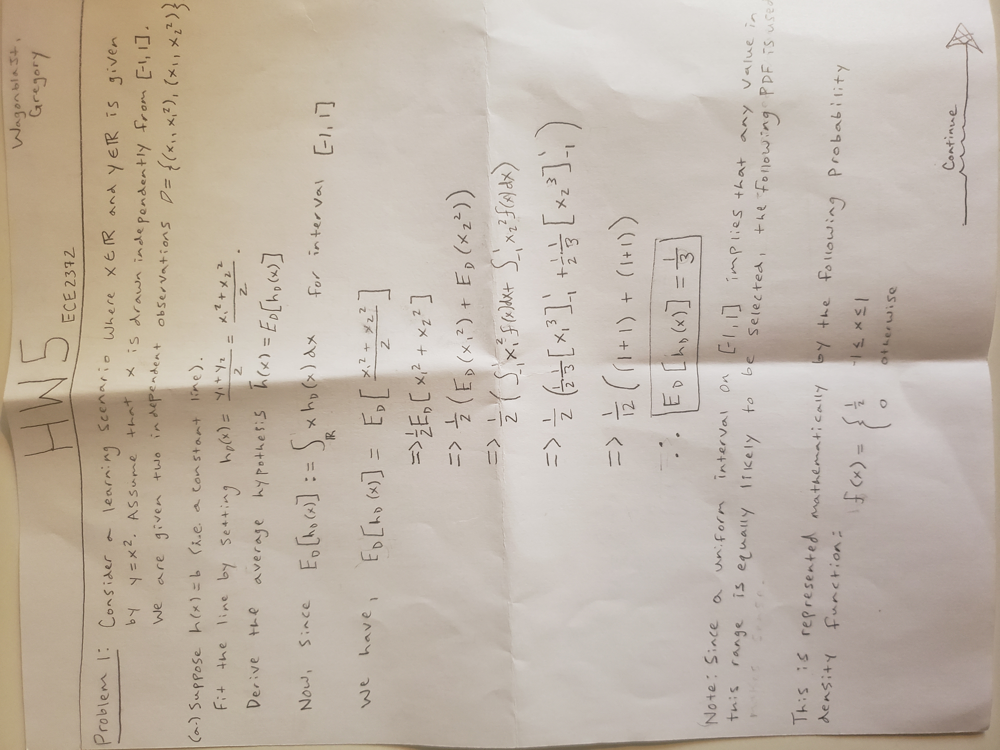

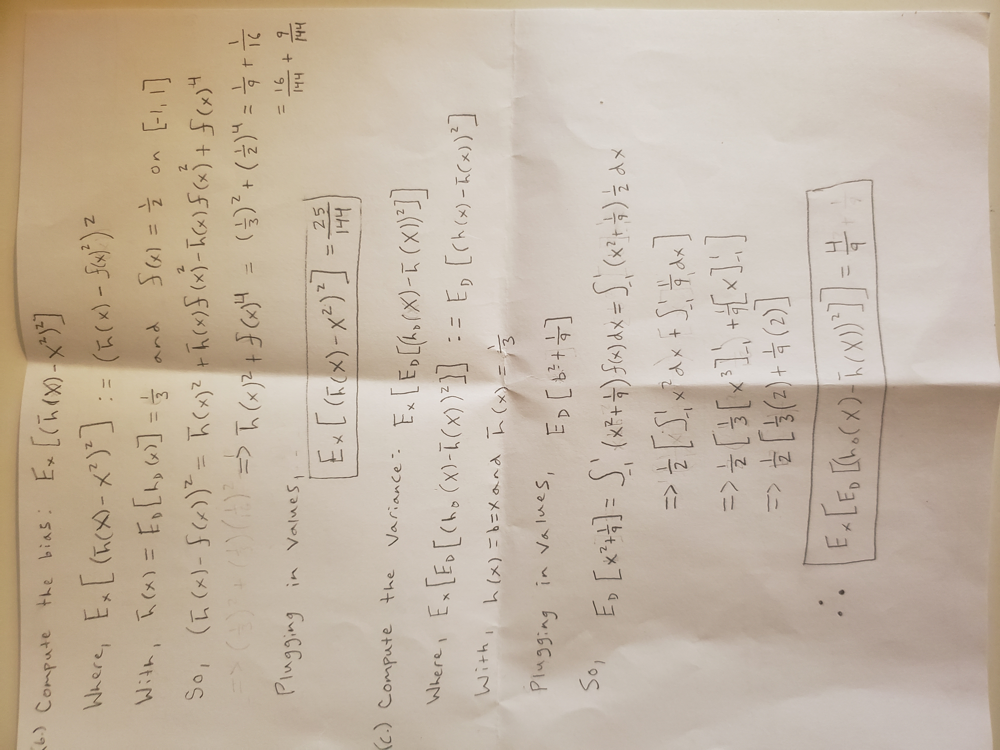

<h2><font color="black">Part (d)</font></h2>

<h2><font color="black">To numerically estimate the average hypothesis, bias, variance, and $\bar{h}(x) = \mathbb{E}_{\mathbb{D}}[h_{\mathbb{D}}(x)]$ we need to do the following: generate a large number of random samples from a given distribution, compute the hypothesis $h_{\mathbb{D}}(x)$, and make our respective computations.</font></h2>

In [116]:
import numpy as np

# Define the hypothesis function. A constant line of the form h(x) = b.
def h_D(x):
    return (1/2) * (x[0]**2 + x[1]**2)

# Define one million samples.
num_samples = 1000000

# Generate random samples from the uniform distribution on interval [-1,1].
samples = np.random.uniform(low=-1, high=1, size=(num_samples, 2))

# Compute the hypothesis for each sample.
hypotheses = np.array([h_D(sample) for sample in samples])

# Compute the average hypothesis.
avg_hypothesis = np.mean(hypotheses)

# The PDF is 1/2 if the samples are on the interval, and 0 otherwise. All samples are on the interval in this case. 
f_x = 1/2

# Compute the bias.
bias = np.mean((avg_hypothesis - f_x)**2)

# Compute the variance.
variance = np.mean((hypotheses - avg_hypothesis)**2)

# Compute E_D[R(h_D)].
ED_R_hD = np.mean(hypotheses * f_x)

# Print out computations.
print("Average Hypothesis: ", avg_hypothesis)
print("Bias: ", bias)
print("Variance: ", variance)
print("E_D[R(h_D)]: ", ED_R_hD)

Average Hypothesis:  0.33340648508864545
Bias:  0.02775339921051971
Variance:  0.0444680643331094
E_D[R(h_D)]:  0.16670324254432273


<h2><font color="red">Comparing the analytical versus computational results, we see that there is a discrepancy between the biases and the variances. The computed bias is off by a factor of 6.25 from the analytical bias and the computed variance is off by a factor of 1/10 from the analytical bias. I'm not sure where my mistake is.</font></h2>

<h2><font color="black">Part (d)</font></h2>

In [120]:
import numpy as np
from scipy.stats import linregress

# Define the hypothesis function. A line of the form h(x) = ax + b.
def h(x):
    return slope * x + intercept

# Define one million samples.
num_samples = 1000000

# Generate random samples from the uniform distribution on interval [-1,1].
samples = np.random.uniform(low=-1, high=1, size=(num_samples, 2))

# Fit a line passing through the two observations.
slope, intercept, _, _, _ = linregress([samples[0][0], samples[1][0]], [samples[0][1], samples[1][1]])

# Compute the hypotheses for each sample.
hypotheses = np.array([h(sample[0]) for sample in samples])

# Compute the average hypothesis.
avg_hypothesis = np.mean(hypotheses)

# The PDF is 1/2 if the samples are on the interval, and 0 otherwise. All samples are on the interval in this case. 
f_x = 1/2

# Compute the bias.
bias = np.mean((avg_hypothesis - f_x)**2)

# Compute the variance.
variance = np.mean((hypotheses - avg_hypothesis)**2)

# Compute E_D[R(h_D)].
ED_R_hD = np.mean(hypotheses * f_x)

# Print out computations.
print("Average Hypothesis (bar{h}(x)): ", avg_hypothesis)
print("Bias: ", bias)
print("Variance: ", variance)
print("E_D[R(h_D)]: ", ED_R_hD)

Average Hypothesis (bar{h}(x)):  -0.3160440990360167
Bias:  0.6659279715715043
Variance:  0.1358685153558724
E_D[R(h_D)]:  -0.15802204951800836


<h2><font color="red">In this case, we would be better off fitting/approximating the quadratic function with a constant line as opposed to a sloped line. This is because the out of sample error will be much less with the constant line due to the calculated bias and variance being much less.</font></h2>

<h2><font color="red">Why and how do the results change though? They change because we are fundamentally using a different hypothesis to fit the quadratic. Firstly, one hypothesis shows a positive relationship between variables and the other shows a negative relationship between variables. This manifests itself in the output of the average hypothesis, we can tell from the sign. Secondly, neither the contant or sloped lines have a lot of flexibility when it comes to approximating the quadratic and we end up with the biases and variances that we do. Clearly, the constant line has less bias and variance though, and wins in terms of approximation in the end.</font></h2>

<h2><font color="black">Problem 2</font></h2>

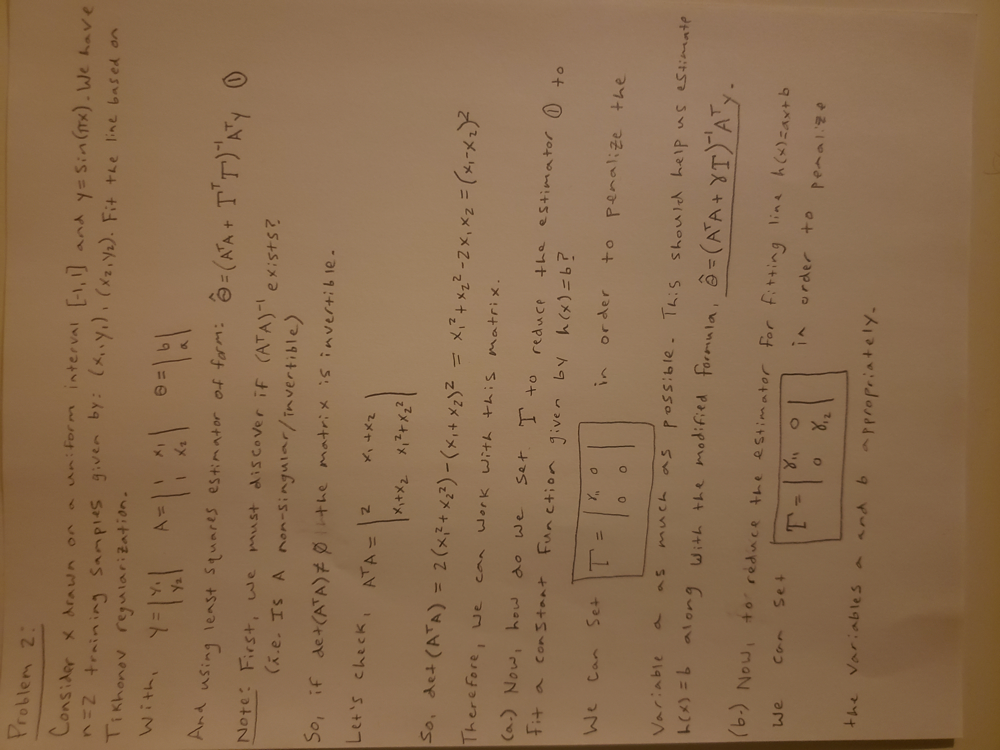

In [193]:
import numpy as np

# Initialize variables.
num_samples = 1000 # Number of datasets.
n = 2 # Number of training samples.
gam = 0.01  # Small value for regularization parameter.

estimates_constant_line = np.zeros((num_samples, n)) # Fitting constant line.
estimates_sloped_line = np.zeros((num_samples, n)) # Fitting sloped line.

gamma1 = np.diag([1,0]) # gamma matrix for h(x) = b
gamma2 = np.diag([1,1]) # gamma matrix for h(x) = ax + b

# Generate random samples from the uniform distribution on interval [-1,1].
x = np.random.uniform(-1, 1, size=2)
y = np.sin(np.pi * x)
A = np.column_stack((np.ones_like(x), x))

# Tikhonov Regularized Least Squares estimation.
estimates_constant_line = np.linalg.lstsq(A.T.dot(A) + gam * gamma1, A.T.dot(y), rcond=None)[0]
estimates_sloped_line = np.linalg.lstsq(A.T.dot(A) + gam * gamma2, A.T.dot(y), rcond=None)[0]

# Compute the average hypothesis.
avg_hypothesis1 = np.mean(estimates_constant_line)
avg_hypothesis2 = np.mean(estimates_sloped_line)

# Compute the bias.
bias1 = np.mean((avg_hypothesis1 - y)**2)
bias2 = np.mean((avg_hypothesis2 - y)**2)

# Compute the variance.
variance1 = np.mean((estimates_constant_line - avg_hypothesis)**2)
variance2 = np.mean((estimates_sloped_line - avg_hypothesis)**2)

# Print out computations.
print("Randomized A matrix:")
print(A)

print("\nTikhonov Regularized Least Squares for a constant line:")
print("Bias:", bias1)
print("Variance:", variance1)

print("\nTikhonov Regularized Least Squares for a sloped line:")
print("Bias:", bias2)
print("Variance:", variance2)

Randomized A matrix:
[[ 1.         -0.61310578]
 [ 1.         -0.34000399]]

Tikhonov Regularized Least Squares for a constant line:
Bias: 0.47931182452064514
Variance: 0.29676136759827465

Tikhonov Regularized Least Squares for a sloped line:
Bias: 0.4157167558282928
Variance: 0.2715375638905098


<h2><font color="red">These estimates are off.</font></h2>

In [90]:
import numpy as np

# Initialize variables.
num_datasets = 1000 # Number of datasets.
n = 2 # Number of training samples.
gam = 0.01  # Small value for regularization parameter.

estimates = np.zeros((num_datasets, n)) # Best fit.

# Generate random samples from the uniform distribution on interval [-1,1].
x = np.random.uniform(-1, 1, size=n)
y = np.sin(np.pi * x)
A = np.column_stack((np.ones_like(x), x))

# Tikhonov Regularized Least Squares estimation.
estimates = np.linalg.lstsq(A.T.dot(A) + gam * np.eye(2), A.T.dot(y), rcond=None)[0]

# Compute risk.
risk = np.mean((estimates - y)**2)

# Iterate over different diagonal matrices T.
for g1 in np.linspace(0, 2, 100):
    for g2 in np.linspace(0, 2, 100):
        # Construct gamma matrix
        T = np.diag([g1, g2])

        # Compute risk for this choice of gamma.
        risk = np.mean(np.linalg.lstsq(A.T @ A + gamma, A.T @ y, rcond=None)[0] - y)**2
        risks.append(((g1, g2), risk))

# Find the best gamma that minimizes risk.
best_T, best_risk = min(risks, key=lambda x: x[1])

print("Random A matrix:")
print(A)
print("Best T:", best_T)
print("Best Risk:", best_risk)

Random A matrix:
[[ 1.         -0.9697583 ]
 [ 1.         -0.07967474]]
Best T: (0.04040404040404041, 0.0)
Best Risk: 2.61530029970522e-06


<h2><font color="red">The matrix that gives the best result is the one that we discussed previously in order to fit a constant line. Although, the optimal weight is specifically 0.0404 for this particular problem.</font></h2>